legi: 22-942-684

# SLT-CE-3: Histogram Clustering

In this coding exercise, you will segment an image with histogram clustering (HC). You will implement two different methods: maximum a posterior probability (MAP) and deterministic annealing (DA) for predicting the cluster membership for each pixel.

<h2 style="background-color:#f0b375;"> References </h2>

[1] Histogram clustering for unsupervised image segmentation: http://ieeexplore.ieee.org/document/784981 

[2] Lecture Slides 5: https://ml2.inf.ethz.ch/courses/slt/lectures/slt21_lecture05.pdf

[3] Lecture script: https://ml2.inf.ethz.ch/courses/slt/tutorials/SLT_Script.pdf, chapter 2.7

<h2 style="background-color:#f0b375;"> Setup </h2>

In [25]:
import sklearn as skl
import matplotlib.pyplot as plt
import numpy as np

from sklearn.utils.validation import check_is_fitted
from matplotlib.image import imread

## Texture and corresponding label map
(This texture is used to fit your model.)

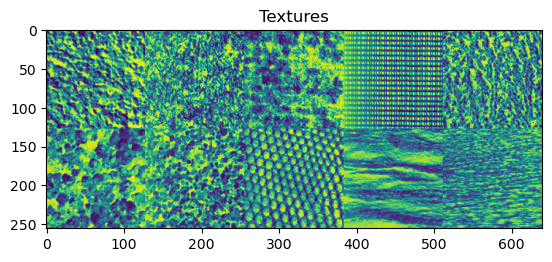

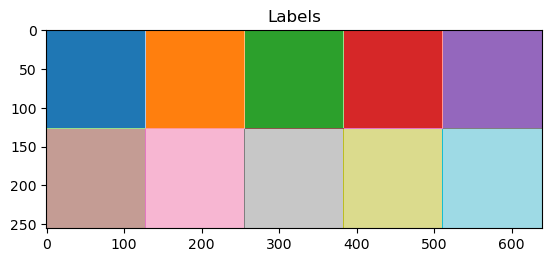

In [26]:
texture = imread("texture.png")

patch_grid_shape = (2, 5)
patch_shape = (128, 128)
label_map = np.ones(texture.shape)
for patch in range(np.prod(patch_grid_shape)):
    i, j = np.unravel_index(patch, patch_grid_shape)
    label_map[patch_shape[0] * i:patch_shape[0] * (i + 1), \
              patch_shape[1] * j:patch_shape[1] * (j + 1)] = np.ravel_multi_index((i, j), patch_grid_shape)

plt.imshow(texture)
plt.title("Textures")
plt.figure()
plt.imshow(label_map, cmap="tab20")
plt.title("Labels")
plt.show()

## Permuted texture and label map
(The permuted texture is used for the prediction)

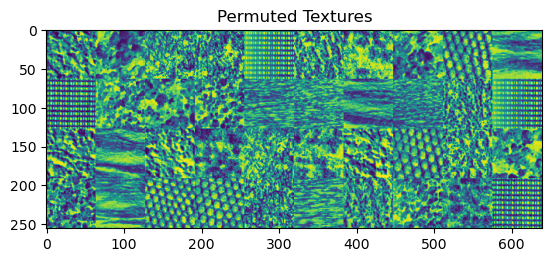

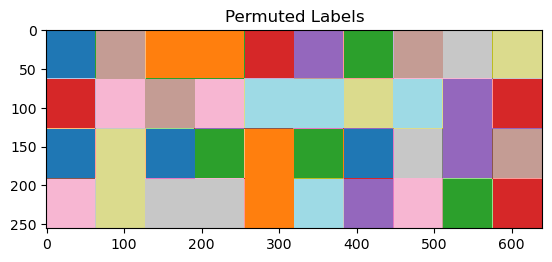

In [27]:
perm_patch_grid_shape = tuple(i * 2 for i in patch_grid_shape)
perm_patch_shape = tuple(i // 2 for i in patch_shape)
n_perm_patches = np.prod(patch_grid_shape) * 4

np.random.seed(5)
perm = np.random.permutation(n_perm_patches)

perm_texture = np.ones(texture.shape)
perm_label_map = np.ones(texture.shape)

for patch, perm_patch in enumerate(perm):
    i, j = np.unravel_index(patch, perm_patch_grid_shape) * np.array(perm_patch_shape)
    ip, jp = np.unravel_index(perm_patch, perm_patch_grid_shape) * np.array(perm_patch_shape)

    perm_texture[ip:ip + perm_patch_shape[0], jp:jp + perm_patch_shape[1]] \
        = texture[i:i + perm_patch_shape[0], j:j + perm_patch_shape[1]]

    perm_label_map[ip:ip + perm_patch_shape[0], jp:jp + perm_patch_shape[1]] \
        = label_map[i:i + perm_patch_shape[0], j:j + perm_patch_shape[1]]

plt.imshow(perm_texture)
plt.title("Permuted Textures")
plt.figure()
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")
plt.show()

<h2 style="background-color:#f0b375;">
Section 4.0 
<span style=font-size:50%> Complete all problems in this section to get a pass on this exercise. </span>
</h2>

<p style="background-color:#adebad;">
    Read the references and recapitulate the parameter estimation formulas for both: maximum a posteriori probability estimation (MAP) and Deterministic Annealing (DA) estimation. In particular, write down how equation (5) in reference <a href=http://ieeexplore.ieee.org/document/784981>[1]</a> looks for the case of DA (using the notation of reference [1]).<br>
Hint: try to derive $\hat P(y|c)$ from $\hat P(c|x)$ and use the maximum entropy principle to find $\hat P(c|x)$.
</p>

Put your recap here.

For both MAP and DA, we need to estimate the conditional probability of Y given X. This can be done simply with the following:

$\hat{P}(y|x)=\frac{n(x,y)}{n(x)}$

In practice, we are going to estimate this quantity by building histograms for each pixel by analyzing the neighboring pixels.

For maximum a posteriori estimation, we have:

$\hat{P}(y|c)=\sum_{x: \hat{c}(x)=c} \frac{n(x)}{\sum_{x': \hat{c}(x')=c} n(x')} \hat{P}(y|x)$

In the case of DA, by choosing $\hat{P}(y|c)$ such that it maximizes the entropy of equation (9), equation (5) becomes (using the notation of the paper): 

$\hat{P}(y|c)=\frac{\sum_i \hat{P}(y|x_i)P(c(x_i)=c|\hat{\theta})}{\sum_i P(c(x_i)=c|\hat{\theta})}=\frac{\sum_i \hat{P}(y|x_i)\frac{1}{Z_i}e^{-\frac{1}{T}h(c, x_i; \hat{\theta})}}{\sum_i \frac{1}{Z_i}e^{-\frac{1}{T}h(c, x_i; \hat{\theta})}}$ (in the notation of the paper $P(c(x_i)=c|\hat{\theta})$ denotes $P(c|x_i, \hat{\theta})$) and we have $Z_i=\sum_be^{-\frac{1}{T}h(b, x_i; \hat{\theta})}$

where we have used the fact that 

$P(c(x)=c|\hat{\theta})=\frac{e^{-\frac{1}{T}h(c, x; \hat{\theta})}}{\sum_b e^{-\frac{1}{T}h(b, x; \hat{\theta})}}$ (this is the Gibbs distribution)

and we simplified the normalization constants. Here, $h(c, x; \hat{\theta})=n(x) D_{KL} (\hat{P}( \cdot | x) || \hat{P}(\cdot |c))$.

Finally, for both MAP and DA, we use $\hat{c}(x)=argmin_a \{ - \sum_{y \in Y} \hat{P}(y|x) \log \hat{P}(y|a) - \log P(\hat{c}_a^x) \}$ where we will neglect the last term since we are going to assume a uniform prior P(c).


In [28]:
from sklearn.feature_extraction import image
from sklearn.preprocessing import normalize

class HistogramClustering(skl.base.BaseEstimator, skl.base.TransformerMixin):
    """Template class for HistogramClustering (HC)
    
    Attributes:
        centroids (np.ndarray): Array of centroid distributions p(y|c) with shape (n_clusters, n_bins).
        
    Parameters:
        n_clusters (int): Number of clusters (textures).
        n_bins (int): Number of bins used to discretize the range of pixel values found in input image X.
        window_size (int): Size of the window used to compute the local histograms for each pixel.
                           Should be an odd number larger or equal to 3.
        random_state (int): Random seed.
        estimation (str): Whether to use Maximum a Posteriori ("MAP") or
                          Deterministic Annealing ("DA") estimation.
    """
    
    def __init__(self, n_clusters=10, n_bins=64, window_size=7, random_state=42, estimation="MAP"):
        self.n_clusters = n_clusters
        self.n_bins =n_bins
        self.window_size = window_size
        self.random_state = random_state
        self.estimation = estimation
        # Add more parameters, if necessary.
    
    def fit(self, X):
        """Compute HC for input image X
        
        Compute centroids.        
        
        Args:
            X (np.ndarray): Input array with shape (height, width)
        
        Returns:
            self
        """
        
        self.n_samples=X.shape[0]*X.shape[1]
        
        X_padded=np.pad(X, int(self.window_size/2), 'constant', constant_values=-1)
        patches=image.extract_patches_2d(X_padded, (self.window_size, self.window_size))
        patches=patches.reshape(patches.shape[0], self.window_size**2)
        
        self.cond_y_x=np.zeros((self.n_samples, self.n_bins))
        
        for i in range(self.n_samples):
            self.cond_y_x[i, :]=self.calculate_histogram(patches[i, :]) #calculate p(y|x)
        
        
        if self.estimation == "MAP":
            
            #we assume uniform prior on P(c). Hence, in equation 6, we do not have to consider the log(P_c) term
            #p_c=1/self.n_clusters*np.ones(n_clusters) 
            
            eps=1e-8
        
            cond_y_c=np.random.rand(self.n_clusters, self.n_bins)
            cond_y_c=cond_y_c/cond_y_c.sum(axis=1, keepdims=True) #initialize p(y|c)
            
            C_hat=np.argmin(-self.cond_y_x.dot(np.log(cond_y_c).T), axis=1)
            C_hat_old=-np.ones(self.n_samples) 
            
            while not np.allclose(C_hat, C_hat_old): #iterative update of cluster assignment and posterior (equations 5 and 6 in reference 1)
                
                C_hat_old=C_hat.copy()
                
                for cluster in range(self.n_clusters):
                    
                    cond_y_c[cluster, :]=np.mean(self.cond_y_x[C_hat==cluster, :],axis=0) #update centroids posterior
                
                cond_y_c+=eps #avoids numerical stability issues
                
                C_hat=np.argmin(-self.cond_y_x.dot(np.log(cond_y_c).T), axis=1)
                
            self.centroids=cond_y_c/cond_y_c.sum(axis=1, keepdims=True)
            self.assignment_map=C_hat
                
                
                
            
        elif self.estimation == "DA":
            
            # Code for Deterministic Annealing estimation
            
            T=0.35
            eta=0.95
            T_min=0.15
            
            eps=1e-8
            
            count=0
            
            cond_y_c=np.random.rand(self.n_clusters, self.n_bins)
            cond_y_c=cond_y_c/cond_y_c.sum(axis=1, keepdims=True) 
                
            
            H_X=((self.cond_y_x*np.log(self.cond_y_x+eps)).sum(axis=1)).reshape((self.n_samples, 1))
            
            self.centroids_list=[]
            
            while T>T_min:
                
                #cond_y_c= #((n_cluster, n_bins))
                
                #cond_y_x=((n_samples, n_bins))
                
                cond_y_c_old=np.ones((self.n_clusters, self.n_bins))
                
                n_iter=0
                max_iter=300
                
                while abs((cond_y_c-cond_y_c_old).max())>1e-5 and n_iter<max_iter:
                    
                    cond_y_c_old=cond_y_c.copy()
                    
                    #D_KL=(n_samples, n_clusters)
                    #calculate Kullback Divergence and update the cluster posterior
                    D_KL=H_X-self.cond_y_x.dot((np.log(cond_y_c)).T)
                    
                    #calculate p(c|theta_hat)
                    un_normalized_posterior=np.exp(-1/T*D_KL)    #(n_samples, n_clusters)
                    post_c_x=normalize(un_normalized_posterior, axis=1, norm='l1') 
                    post_c_x+=eps #avoids numerical stability issues
                    
                    #update the feature posterior (p(y|c))
                    cond_y_c=((post_c_x.T).dot(self.cond_y_x))/((post_c_x.sum(axis=0)).reshape(self.n_clusters, 1))
                    cond_y_c+=eps
                    
                    n_iter+=1
                    
                T=T*eta #we decrease the temperature
                
                #we save the centroids in a list with their corresponding temperature. This will
                #be used in the predict method to compare the performance at different temperatures
                self.centroids_list.append((cond_y_c/cond_y_c.sum(axis=1, keepdims=True), T))
                count+=1
    
                
            self.centroids=cond_y_c/cond_y_c.sum(axis=1, keepdims=True)
                
        return self
    
    
    def calculate_histogram(self, patch):
        
        patch=patch[patch>=0] #we don't consider padded pixels
    
        hist, edges=np.histogram(patch, bins=np.linspace(0,1,self.n_bins+1), density=True)
        
        return hist*np.diff(edges)
                
        
        
    def predict(self, X):
        """Predict cluster assignments for each pixel in image X.
        
        Args:
            X (np.ndarray): Input array with shape (height, width)
            
        Returns:
            C (np.ndarray): Assignment map (height, width) 
        """
        check_is_fitted(self, ["centroids"])

        #centroids=(n_clusters, n_bins)
        
        # Your code goes here
        
        eps=1e-8
        
        X_padded=np.pad(X, int(self.window_size/2), 'constant', constant_values=-1)
        patches=image.extract_patches_2d(X_padded, (self.window_size, self.window_size))
        patches=patches.reshape(patches.shape[0], self.window_size**2)

        self.pred_cond_y_x=np.zeros((self.n_samples, self.n_bins))

        for i in range(self.n_samples):
            self.pred_cond_y_x[i, :]=self.calculate_histogram(patches[i, :]) #calculate p(y|x)
        
        if self.estimation=='MAP':
                
            C_hat=np.argmin(-self.pred_cond_y_x.dot(np.log(self.centroids).T), axis=1)
            C_hat=C_hat.reshape(X.shape)
            
            return C_hat
            
        elif self.estimation=='DA':
            
            eps=1e-8
            
            predicted_textures=[]
            
            H_X=((self.pred_cond_y_x*np.log(self.pred_cond_y_x+eps)).sum(axis=1)).reshape((self.n_samples, 1))
                                               
            for i in range(len(self.centroids_list)):
                                               
                T=(self.centroids_list[i])[1]
                                               
                D_KL=H_X-self.pred_cond_y_x.dot(np.log((self.centroids_list[i])[0]).T)
                un_normalized_posterior=np.exp(-1/T*D_KL)    #(n_samples, n_clusters)
                post_c_x=normalize(un_normalized_posterior, axis=1, norm='l1') #p(c|theta_hat)

                C_hat=np.argmin(-self.pred_cond_y_x.dot(np.log((self.centroids_list[i])[0]).T), axis=1)
                C_hat=C_hat.reshape(X.shape)
                                               
                predicted_textures.append((C_hat, T))
            
        
            return predicted_textures
    
    def generate(self, C):
        """Generate a sample image X from a texture label map C.
        
        The entries of C are integers from the set {1,...,n_clusters}. They represent the texture labels
        of each pixel. Given the texture labels, a sample image X is generated by sampling
        the value of each pixel from the fitted p(y|c).
        
        Args:
            C (np.ndarray): Input array with shape (height, width)
            
        Returns:
            X (np.ndarray): Sample image (height, width)
        """
        check_is_fitted(self, ["centroids"])
        
        # Your code goes here
        
        X=np.zeros(C.shape)
        
        for i in range(C.shape[0]):
            for j in range(C.shape[1]):
                X[i,j]=np.random.choice(self.n_bins, p=self.centroids[int(C[i,j]) ,:])/self.n_bins
    
                
        return X

<p style="background-color:#adebad;">
Implement the "MAP" part of the <b>fit method</b> for the template class HistogramClustering, according to the contract outlined in its docstring. You can add more class methods if necessary. Create an instance of your HC class with n_clusters = 10 and fit the image texture. Record the execution time.
</p>

In [29]:
%%time
np.random.seed(0) #set random seed to have reproducibility (it didn't work for me to fix the random state inside the class
#so I decided to set it outside)

HC = HistogramClustering(n_bins=128) #we choose n_bins=128 instead of 64 to have a better performance
HC.fit(texture)
check_is_fitted(HC, ["centroids"])

CPU times: total: 16.3 s
Wall time: 43.1 s


<h2 style="background-color:#f0b375;">
Section 4.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 4.5 </span>
</h2>

<p style="background-color:#adebad;">
    <ul style="background-color:#adebad;">
        <li> Implement the <b>predict method</b> for the template class HC, according to the contract outlined in its docstring.
        </li>        
        <li>
            Use HC.predict to predict the texture labels of perm_texture. Plot the predicted label map.
        </li>
    </ul>
</p>

In [30]:
%%time
predicted_perm_label_map = HC.predict(perm_texture)

CPU times: total: 13.6 s
Wall time: 35.2 s


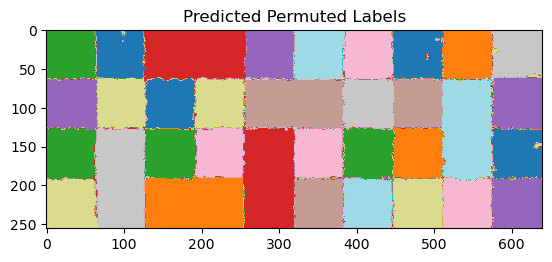

In [31]:
# Plot of predicted label map

plt.figure()
plt.imshow(predicted_perm_label_map, cmap="tab20")
plt.title("Predicted Permuted Labels")
plt.show()

<p style="background-color:#adebad;">
    Plot the confusion matrix for your predictions, using the perm_label_map. Make sure to permute the texture labels appropriately, to make them correspond to the true labels (see Hungarian algortihm to find the best match).
</p>

[[16128    45     0    90    29    24    12    20    36     0]
 [    3 16327     3     0     5    16    20     4     6     0]
 [   92   183 15696    58   125    54    49   101    26     0]
 [  101   145     5 16071     7    17    10     1    27     0]
 [   73    64    45   125 15891    33    62    79     9     3]
 [   45   213    32    65    52 15729   188    47    11     2]
 [   56   150    58   126     2    28 15852    93    19     0]
 [   67    71     0    14    24    11    30 16139    28     0]
 [   65    73    26   149    16    10   195    67 15776     7]
 [   16   119    17    76   127    23    12    97   273 15624]]


<Figure size 640x480 with 0 Axes>

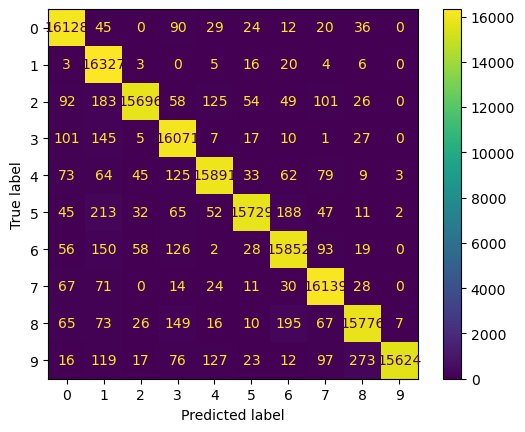

In [32]:
# Confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
from scipy.optimize import linear_sum_assignment

texture_dim=(int(texture.shape[0]/perm_patch_grid_shape[0]), int(texture.shape[1]/perm_patch_grid_shape[1]))

#mapped_perm_label_map= mapping(texture_dim, perm_patch_grid_shape,predicted_perm_label_map, perm_label_map)

cost_matrix=np.zeros((10,10)).astype(int)

for i in range(predicted_perm_label_map.shape[0]): #we create the cost matrix that we will use for Hungarian algorithm
    for j in range(predicted_perm_label_map.shape[1]):
        cost_matrix[int(perm_label_map[i][j])][int(predicted_perm_label_map[i][j])]+=1 
        
HC_row_ind, HC_col_ind=linear_sum_assignment(1000-cost_matrix)

HC_confusion=cost_matrix[:, HC_col_ind]
print(HC_confusion)

plt.figure()
disp=ConfusionMatrixDisplay(HC_confusion)
disp.plot()
plt.show()

In [33]:
print('HC accuracy for 128 bins: ' +str(np.diagonal(HC_confusion).sum()/HC_confusion.sum())) #accuracy of HC clustering

HC accuracy for 128 bins: 0.971881103515625


<p style="background-color:#adebad;">
    Using n_clusters=10, fit HC with all combinations of n_bins = 16, 32, 64 and window_size = 7, 9, 11.
    For each setting compute the accuracy of the prediction on perm_texture. Show the results in a 3x3 matrix and label the axes properly.
</p>

In [45]:
# 3x3 Matrix with accuracy scores of the different parameter combination

np.random.seed(0) #set random seed to ensure reproducibility

n_bins=[16, 32, 64]
window_sizes=[7,9,11]
accuracies=np.zeros((3,3))
predictions=[]

for i in range(len(n_bins)):
    for j in range(len(window_sizes)):
        HC_new = HistogramClustering(n_bins=n_bins[i], window_size=window_sizes[j])
        HC_new.fit(texture)
        pred=HC_new.predict(perm_texture)
        
        cost_matrix=np.zeros((10,10)).astype(int)

        for l in range(pred.shape[0]): #we create the cost matrix that we will use for Hungarian algorithm
            for k in range(pred.shape[1]):
                cost_matrix[int(perm_label_map[l][k])][int(pred[l][k])]+=1 

        row_ind, col_ind=linear_sum_assignment(1000-cost_matrix)

        confusion=cost_matrix[:, col_ind]
        
        predictions.append([pred, n_bins[i], window_sizes[j]])
        accuracies[i,j]=np.diagonal(confusion).sum()/confusion.sum()
        

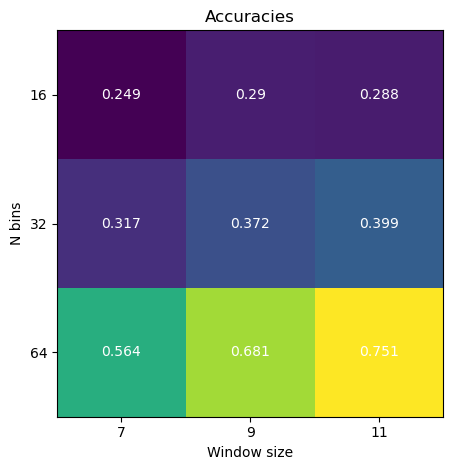

In [46]:
fig, ax = plt.subplots()
im = ax.imshow(accuracies)

# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(3), labels=window_sizes)
ax.set_yticks(np.arange(3), labels=n_bins)

# Loop over data dimensions and create text annotations.
for i in range(3):
    for j in range(3):
        text = ax.text(j, i, float(round(accuracies[i,j], 3)),
                       ha="center", va="center", color="w")
        
plt.xlabel("Window size")
plt.ylabel("N bins")

ax.set_title("Accuracies")
fig.tight_layout()
plt.show()

<p style="background-color:#adebad;">
    For each setting plot the prediction (i.e. the clustering) of the texture (perm_texture) itself. Arrange the plots next to each other in a grid and label them accordingly.
    </p>

<Figure size 640x480 with 0 Axes>

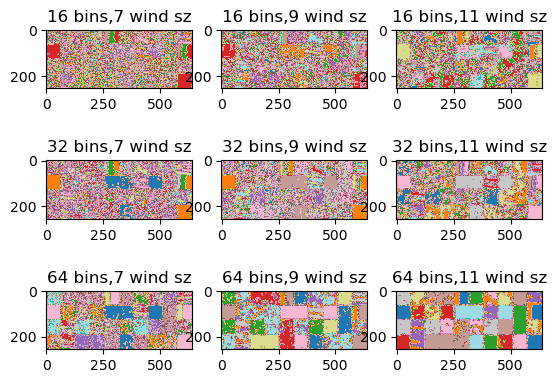

In [47]:
# Cluster predictions (9 plots arranged in a 3x3 grid)

plt.figure()
fig, axs= plt.subplots(3,3)

for prediction in predictions:
    axs[n_bins.index(prediction[1]), window_sizes.index(prediction[2])].imshow(prediction[0], cmap="tab20")
    axs[n_bins.index(prediction[1]), window_sizes.index(prediction[2])].set_title(str(prediction[1]) + " bins," + str(prediction[2]) + " wind sz")
    
plt.show()

<h2 style="background-color:#f0b375;">
Section 5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5 </span>
</h2>

<ul style="background-color:#adebad;">
        <li> Implement the <b>generate</b> method for the template class HC, according to the contract outlined in its docstring.
        </li>
        <li>
        Use HC.generate to generate ten 128x128 patches, one for each texture. Plot the generated textures next to the ground truth textures.
        </li>
    </ul>

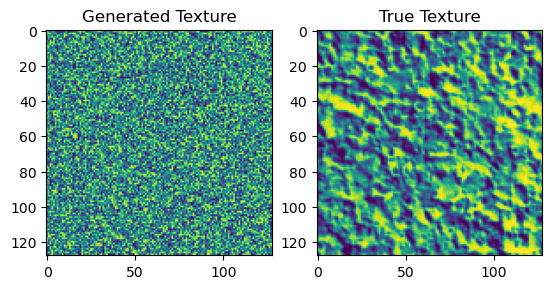

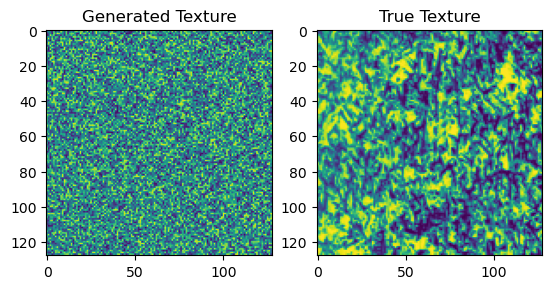

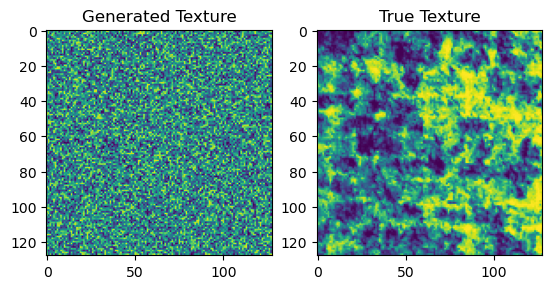

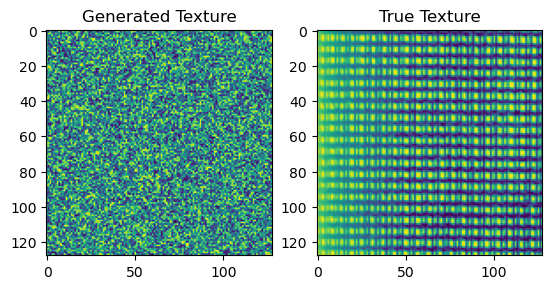

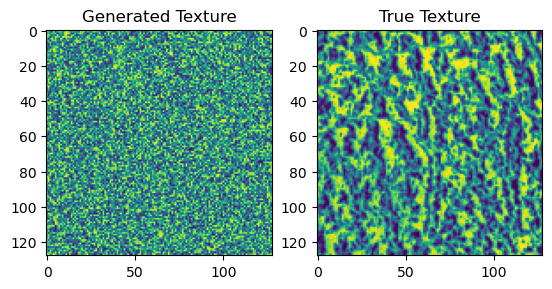

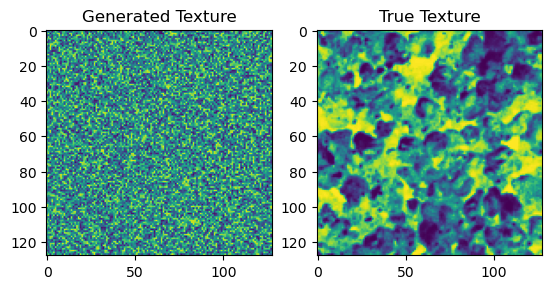

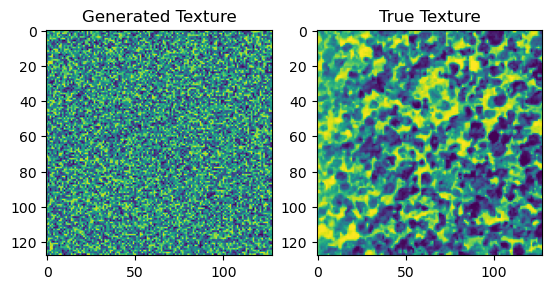

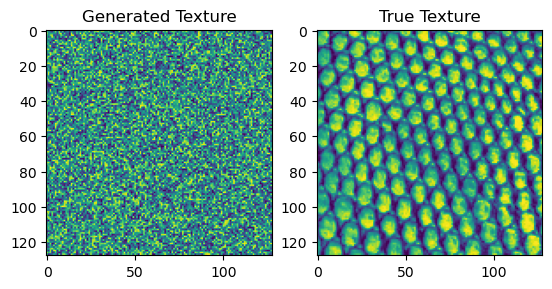

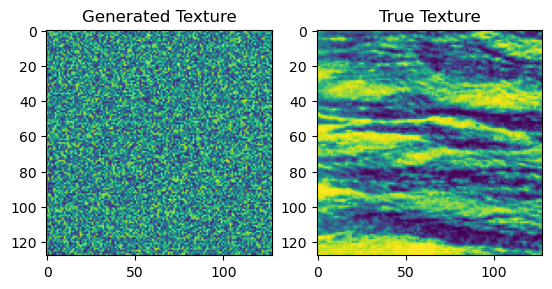

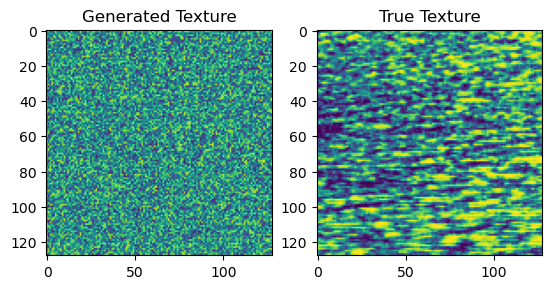

In [34]:
for i in range(HC.n_clusters):
    
    if i<=4:
    
        C=np.ones(patch_shape)*HC_col_ind[i]
        pred_texture=HC.generate(C)
        
        fig, axs=plt.subplots(1,2)
        axs[0].imshow(pred_texture)
        axs[0].set_title("Generated Texture")
        axs[1].imshow(texture[0:128, i*128:(i+1)*128])
        axs[1].set_title("True Texture")
        plt.show()
    
    else:
        
        C=np.ones(patch_shape)*HC_col_ind[i]
        pred_texture=HC.generate(C)
        
        fix, axs=plt.subplots(1,2)
        axs[0].imshow(pred_texture)
        axs[0].set_title("Generated Texture")
        axs[1].imshow(texture[128:256, (i-5)*128:(i-4)*128])
        axs[1].set_title("True Texture")
        plt.show()


Since we don't have a nice result for the generated texture (generated textures look very similar to each other) for n_bins=128, we will show the result for n_bins=64, where instead we can notice some difference in the color intensities of each texture (althugh for n_bins=64 we have lower performance when we calculate the accuracy of label predictions). Here we decided to plot the whole texture as it is easier to see the difference in color intensities between textures

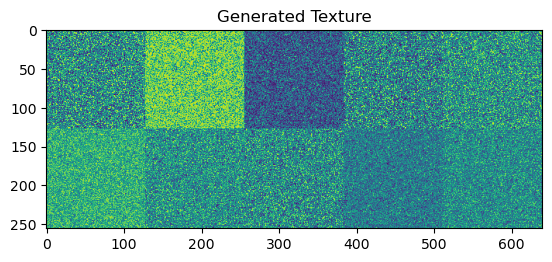

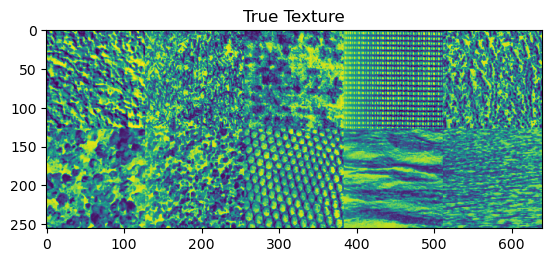

In [35]:
np.random.seed(0) #set random seed to ensure reproducibility

HC_gen = HistogramClustering(n_bins=64) #we choose n_bins=128 instead of 64 to have a better performance
HC_gen.fit(texture)
check_is_fitted(HC_gen, ["centroids"])

gen_predicted_perm_label_map = HC_gen.predict(perm_texture)

texture_dim=(int(texture.shape[0]/perm_patch_grid_shape[0]), int(texture.shape[1]/perm_patch_grid_shape[1]))

#mapped_perm_label_map= mapping(texture_dim, perm_patch_grid_shape,predicted_perm_label_map, perm_label_map)

cost_matrix=np.zeros((10,10)).astype(int)

for i in range(gen_predicted_perm_label_map.shape[0]): #we create the cost matrix that we will use for Hungarian algorithm
    for j in range(gen_predicted_perm_label_map.shape[1]):
        cost_matrix[int(perm_label_map[i][j])][int(gen_predicted_perm_label_map[i][j])]+=1 
        
HC_gen_row_ind, HC_gen_col_ind=linear_sum_assignment(1000-cost_matrix)

HC_gen_confusion=cost_matrix[:, HC_gen_col_ind]

gen_pred_texture=np.zeros(texture.shape)


for i in range(HC_gen.n_clusters):
    
    if i<=4:
    
        C=np.ones(patch_shape)*HC_gen_col_ind[i]
        gen_pred_texture[0:128, i*128:(i+1)*128]=HC_gen.generate(C)
    
    else:
        
        C=np.ones(patch_shape)*HC_gen_col_ind[i]
        gen_pred_texture[128:256, (i-5)*128:(i-4)*128]=HC_gen.generate(C)
        
    
plt.figure()
plt.imshow(gen_pred_texture)
plt.title("Generated Texture")
plt.show()

plt.figure()
plt.imshow(texture)
plt.title("True Texture")
plt.show()


In [36]:
print('HC accuracy for 64 bins: ' +str(np.diagonal(HC_gen_confusion).sum()/HC_gen_confusion.sum())) 

HC accuracy for 64 bins: 0.55848388671875


For completeness, we now also compare the generated texture for n_bins=128 with the generated texture by using the empirical histograms as generative distribution instead of the centroids. We see that our generated texture looks very similar to the ones generated with the empirical histograms. Of course, since we are independently sampling the bin for each pixel, we cannot recover any structure of the texture but we will have pure randomness

In [37]:
def generate_empirical(histograms, C):
    
    X=np.zeros(C.shape)

    for i in range(C.shape[0]):
        for j in range(C.shape[1]):
            X[i,j]=np.random.choice(128, p=histograms[int(C[i,j]) ,:])/128


    return X

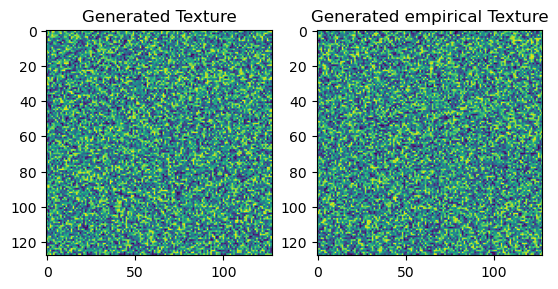

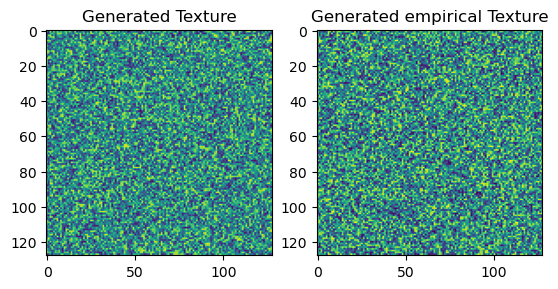

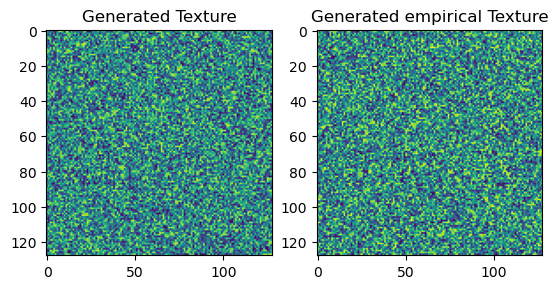

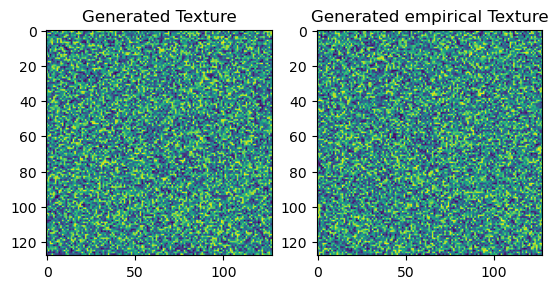

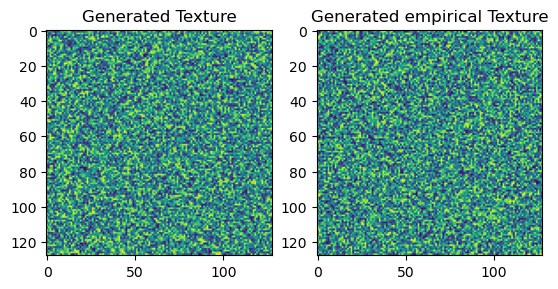

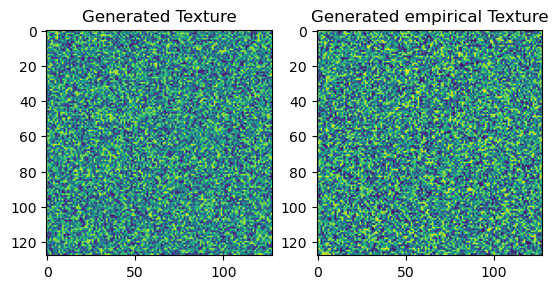

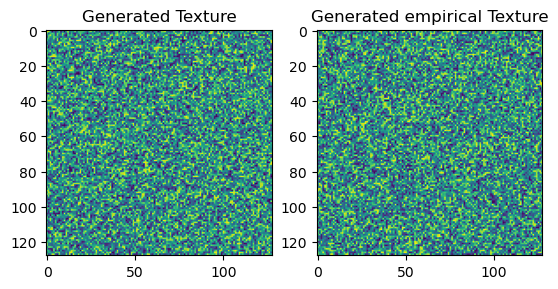

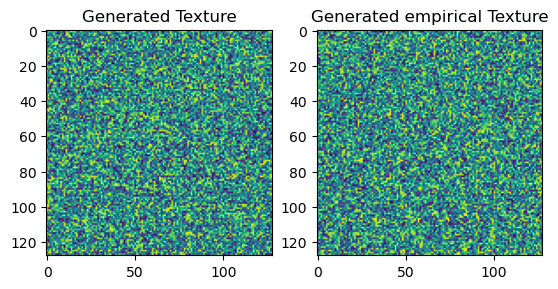

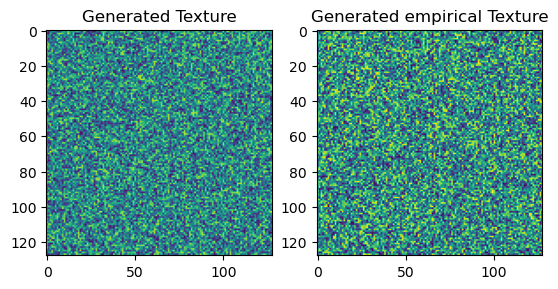

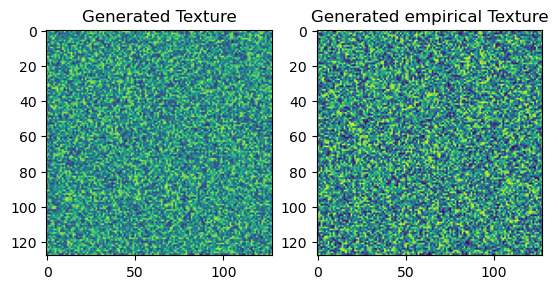

In [38]:
empirical_histograms=np.zeros(HC.centroids.shape)

for i in range(HC.n_clusters):
    
    if i<=4:
    
        cluster_texture=texture[0:128, i*128:(i+1)*128]
    
    else:

        cluster_texture=texture[128:256, (i-5)*128:(i-4)*128]
        
    hist, edges=np.histogram(cluster_texture, bins=np.linspace(0,1,HC.n_bins+1), density=True)
    empirical_histograms[i, :]=hist*np.diff(edges)
    
for i in range(HC.n_clusters):

    C=np.ones(patch_shape)*HC_col_ind[i]
    pred_texture=HC.generate(C)

    pred_texture_empirical=generate_empirical(empirical_histograms, C)

    fig, axs=plt.subplots(1,2)
    axs[0].imshow(pred_texture)
    axs[0].set_title("Generated Texture")
    axs[1].imshow(pred_texture_empirical)
    axs[1].set_title("Generated empirical Texture")
    plt.show()




<h2 style="background-color:#f0b375;">
Section 5.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.5 </span>
</h2>

<ul style="background-color:#adebad;">
    <li>
        Use k-means clustering to cluster the pixels of the texture (perm_texture). Set n_clusters=10, and use the local histogram vectors as features. Compare the predicted label map with k-means with the predicted label map obtained by HC.
    </li>
</ul>

C:\Users\faran\anaconda3\envs\slt-ce\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


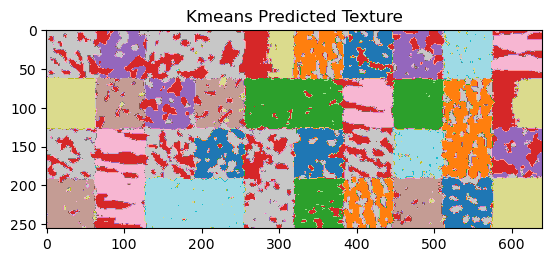

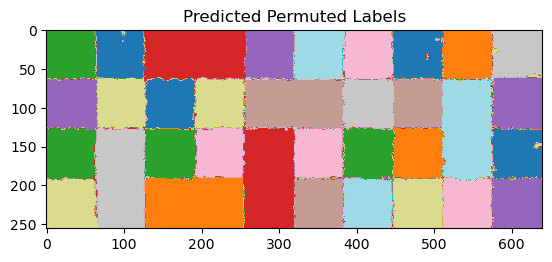

In [39]:
# Predicted label map for k-means

from sklearn.cluster import KMeans

kmeans_pred_perm_label_map=KMeans(n_clusters=10, random_state=42).fit_predict(HC.pred_cond_y_x) 
kmeans_pred_perm_label_map=kmeans_pred_perm_label_map.reshape(predicted_perm_label_map.shape)

plt.figure()
plt.imshow(kmeans_pred_perm_label_map, cmap="tab20")
plt.title("Kmeans Predicted Texture")

# Predicted label map for HC

plt.figure()
plt.imshow(predicted_perm_label_map, cmap="tab20")
plt.title("Predicted Permuted Labels")
plt.show()



We clearly see that HC clustering can achieve a much better performance than K-means for this task. In particular, K-means fails to recognize/recover some of the clusters. Please note that for this part of the task, we haven't mapped the labels yet so we have different colors in Kmeans and HC corresponding to the same label. We will proceed with the mapping in the next point, where we will compare the two confusion matrices, whereas here we just limited ourselves to show the overall quality of the two methods

<ul style="background-color:#adebad;">
    <li>
        Plot and compare the confusion matrices for both, k-means, and HC.
    </li>
</ul>

<Figure size 640x480 with 0 Axes>

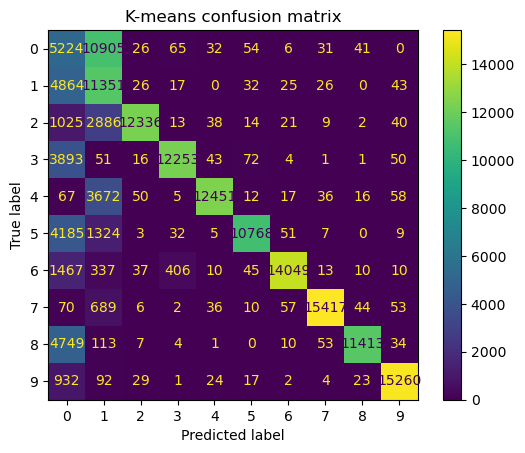

<Figure size 640x480 with 0 Axes>

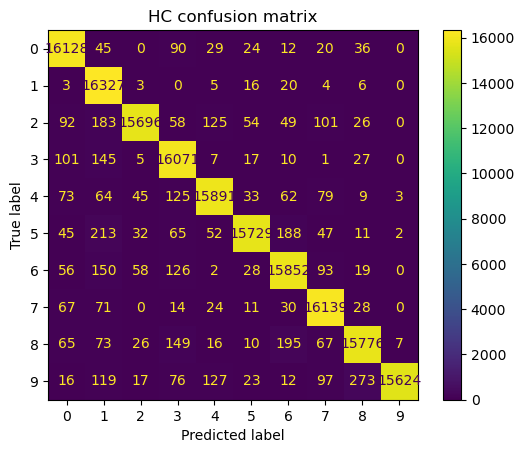

In [40]:
# Confusion matrices

kmeans_cost_matrix=np.zeros((10,10)).astype(int)

for l in range(kmeans_pred_perm_label_map.shape[0]): #we create the cost matrix that we will use for Hungarian algorithm
    for k in range(kmeans_pred_perm_label_map.shape[1]):
        kmeans_cost_matrix[int(perm_label_map[l][k])][int(kmeans_pred_perm_label_map[l][k])]+=1 

row_ind, col_ind=linear_sum_assignment(1000-kmeans_cost_matrix)

kmeans_confusion=kmeans_cost_matrix[:, col_ind]

plt.figure()
disp_kmeans=ConfusionMatrixDisplay(kmeans_confusion)
disp_kmeans.plot()
plt.title('K-means confusion matrix')
plt.show()

plt.figure()
disp_HC=ConfusionMatrixDisplay(HC_confusion)
disp_HC.plot()
plt.title('HC confusion matrix')
plt.show()



It is clear to see that Kmeans does a poorer job in predicting the clusters. While HC clustering manages to recover all the clusters (as shown in previous section), K-means clearly does not. In particular, from the confusion matrix we can see that Kmeans has troubles to recognize and distinguish cluster 0 and 1. Moreover, apart from clusters 7 and 9 where Kmeans has a comparable performance with HC clustering, for all the other clusters the percentage of correct assignments is much lower.

<ul style="background-color:#adebad;">
        <li>
Plot the centroid histograms $\hat P(y|c)$ after fitting the texture image, one centroid histogram for every texture image. Compare them to the empirical histograms (i.e. show them both in one plot).
        </li>
    </ul>

<Figure size 640x480 with 0 Axes>

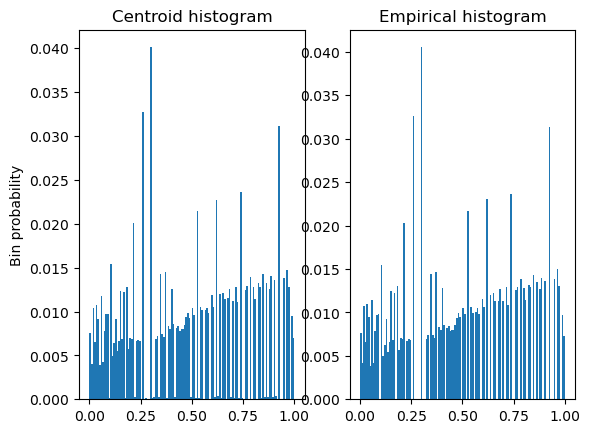

<Figure size 640x480 with 0 Axes>

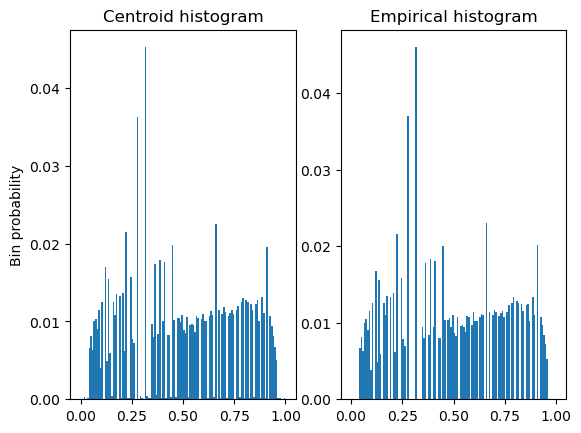

<Figure size 640x480 with 0 Axes>

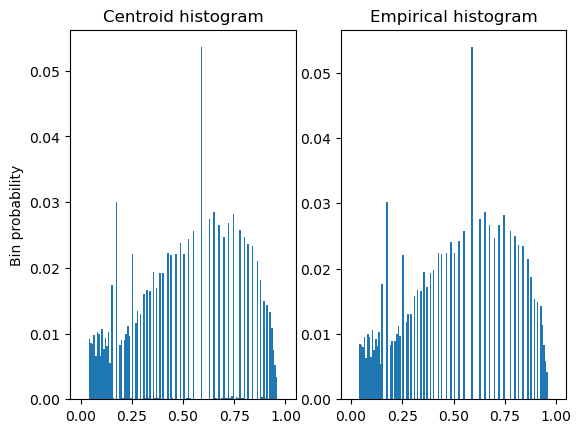

<Figure size 640x480 with 0 Axes>

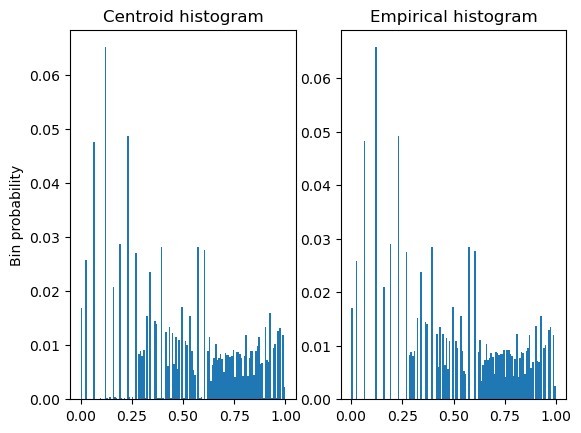

<Figure size 640x480 with 0 Axes>

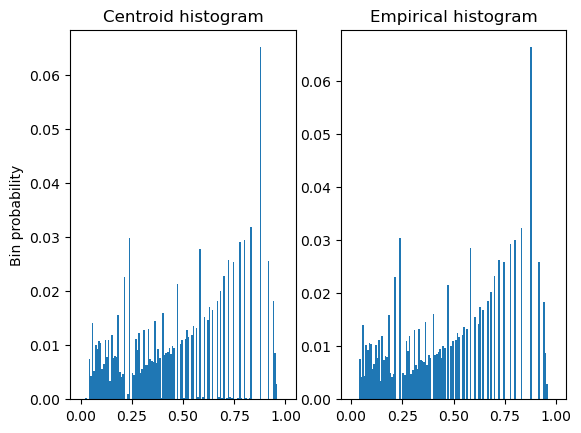

<Figure size 640x480 with 0 Axes>

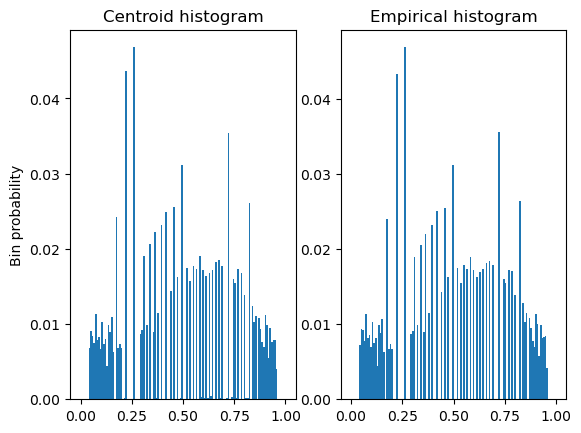

<Figure size 640x480 with 0 Axes>

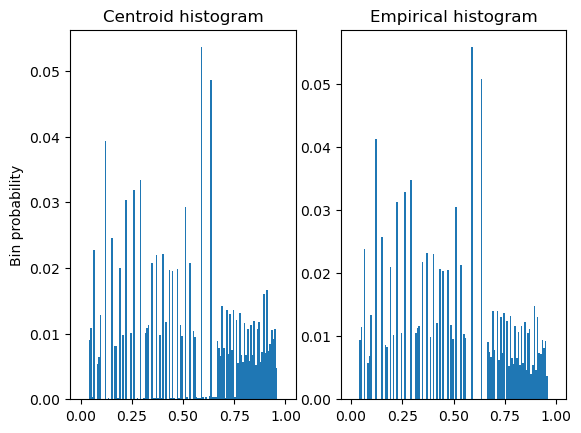

<Figure size 640x480 with 0 Axes>

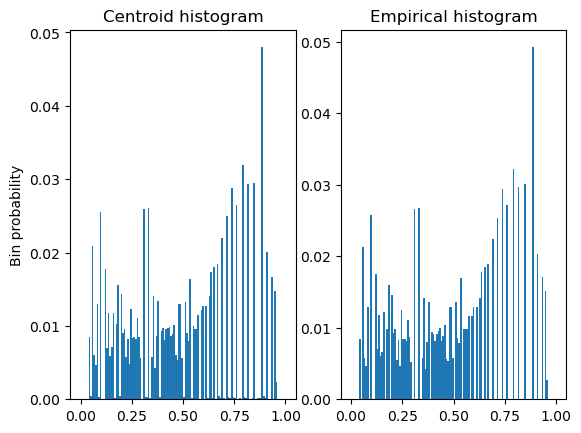

<Figure size 640x480 with 0 Axes>

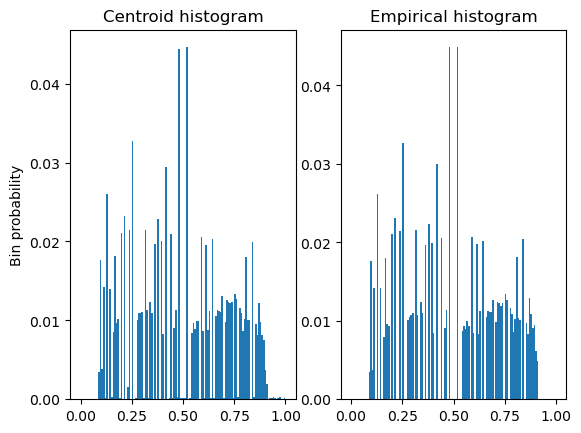

<Figure size 640x480 with 0 Axes>

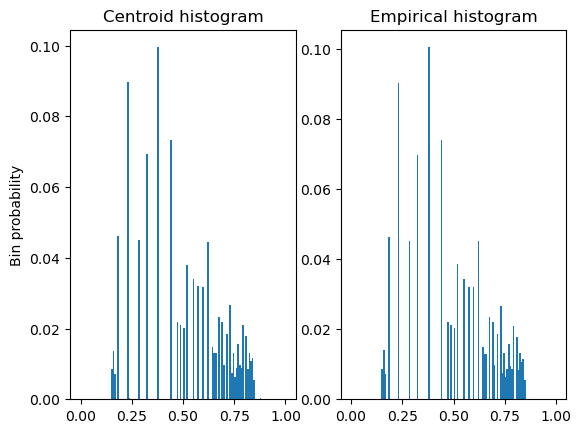

In [41]:
# Histograms

for i in range(HC.n_clusters):
    
    if i<=4:
    
        cluster_texture=texture[0:128, i*128:(i+1)*128]
    
    else:

        cluster_texture=texture[128:256, (i-5)*128:(i-4)*128]
        
    
    hist, edges=np.histogram(cluster_texture, bins=np.linspace(0,1,HC.n_bins+1), density=True)
    texture_prob=hist*np.diff(edges)
    
    x=range(0, HC.n_bins)
    
    plt.figure()
    fig, axs= plt.subplots(1,2)
    axs[0].stairs(HC.centroids[HC_col_ind[i], :], edges=np.linspace(0,1,HC.n_bins+1), fill=True)
    #axs[0].bar(x, HC.centroids[i, :])
    axs[0].set_title("Centroid histogram")
    axs[1].stairs(texture_prob, edges=np.linspace(0,1,HC.n_bins+1), fill=True)
    #axs[1].bar(x, texture_prob)
    axs[1].set_title('Empirical histogram')
    
    axs[0].set_ylabel("Bin probability")
    
    #on the y axis, we don't have the value of the density but we gave the bin probability directly (i.e. density*bin_width)
    plt.show()

We also plot the histograms for 32 histogram bins (and still n_bins=128 in HC definition)

<Figure size 640x480 with 0 Axes>

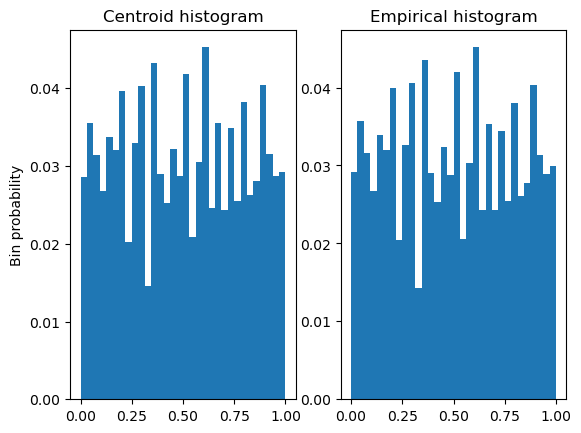

<Figure size 640x480 with 0 Axes>

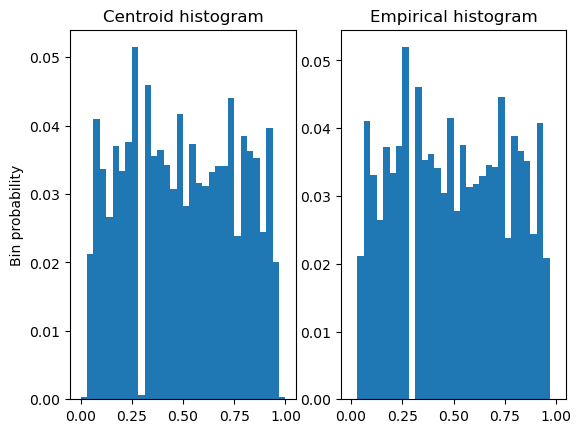

<Figure size 640x480 with 0 Axes>

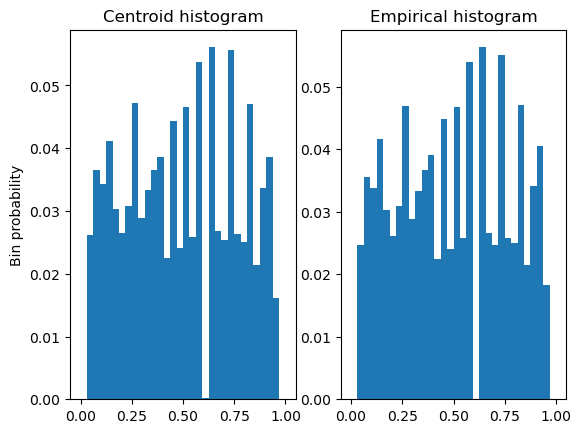

<Figure size 640x480 with 0 Axes>

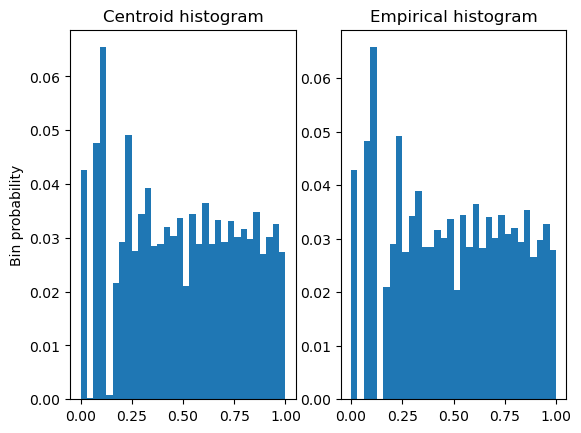

<Figure size 640x480 with 0 Axes>

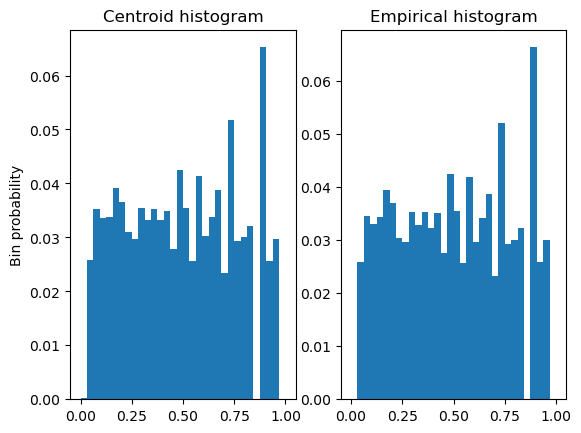

<Figure size 640x480 with 0 Axes>

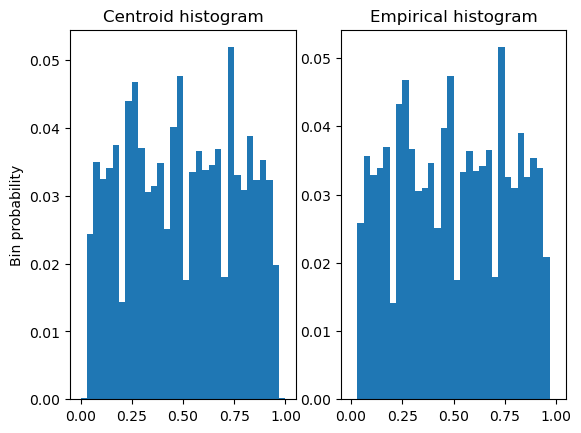

<Figure size 640x480 with 0 Axes>

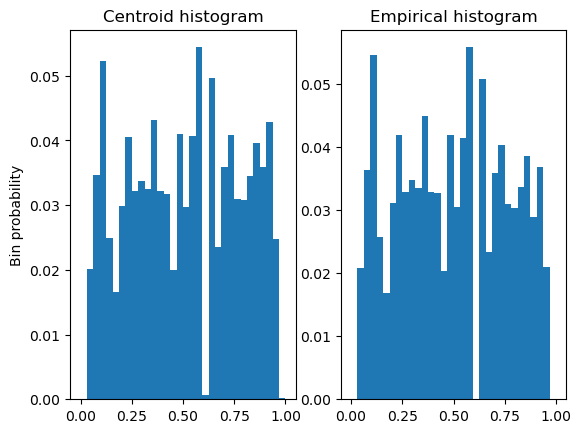

<Figure size 640x480 with 0 Axes>

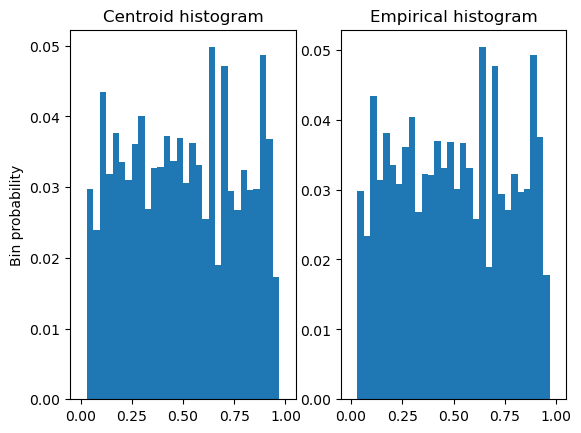

<Figure size 640x480 with 0 Axes>

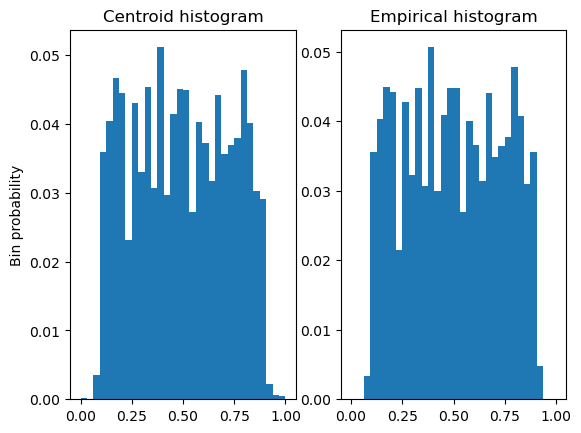

<Figure size 640x480 with 0 Axes>

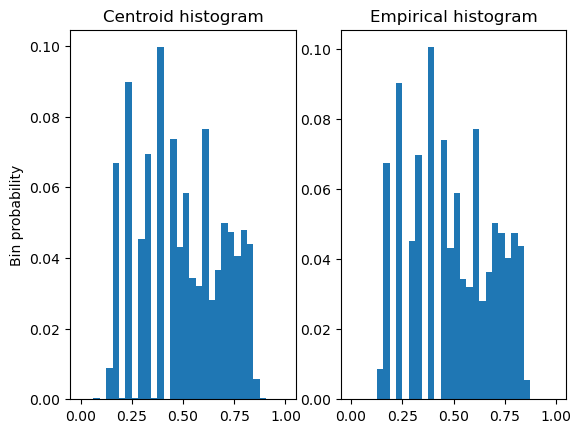

In [42]:
for i in range(HC.n_clusters):
    
    if i<=4:
    
        cluster_texture=texture[0:128, i*128:(i+1)*128]
    
    else:

        cluster_texture=texture[128:256, (i-5)*128:(i-4)*128]
        
    hist, edges=np.histogram(cluster_texture, bins=np.linspace(0,1,HC.n_bins+1), density=True)
    texture_prob=hist*np.diff(edges)
    
    new_texture_prob=np.zeros(int(HC.n_bins/4))
    new_centroids_prob=np.zeros(int(HC.n_bins/4))
    
    for j in range(len(new_texture_prob)):
        
        new_texture_prob[j]=np.sum(texture_prob[j*4:(j+1)*4])
        new_centroids_prob[j]=np.sum(HC.centroids[HC_col_ind[i], j*4:(j+1)*4])
        
    
    plt.figure()
    fig, axs= plt.subplots(1,2)
    axs[0].stairs(new_centroids_prob, edges=np.linspace(0,1,int(HC.n_bins/4)+1), fill=True)
    axs[0].set_title("Centroid histogram")
    axs[1].stairs(new_texture_prob, edges=np.linspace(0,1,int(HC.n_bins/4)+1), fill=True)
    axs[1].set_title('Empirical histogram')
    
    axs[0].set_ylabel("Bin probability")
    
    #on the y axis, we don't have the value of the density but we gave the bin probability directly (i.e. density*bin_width)
    plt.show()

<h2 style="background-color:#f0b375;">
Section 6.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 6.0 </span>
</h2>

<ul style="background-color:#adebad;">
        <li>
        Implement the "DA" part of HC.fit.
        </li>
    </ul>

In [43]:
%%time
np.random.seed(42) #set random seed to ensure reproducibility

HC_DA = HistogramClustering(estimation="DA", n_bins=128)
HC_DA.fit(texture)
check_is_fitted(HC_DA, ["centroids"])

CPU times: total: 2min 59s
Wall time: 2min 44s


<ul style="background-color:#adebad;">
        <li>
        Plot the clustering (predicted labels) of the texture (perm_texture) at different temperatures during the annealing schedule. Describe what you observe.
        </li>
    </ul>

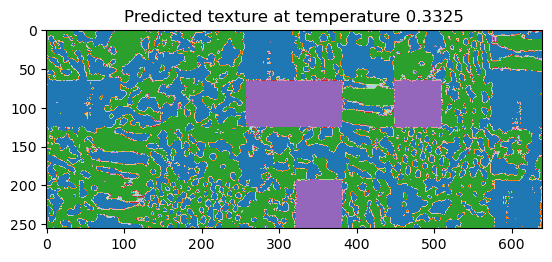

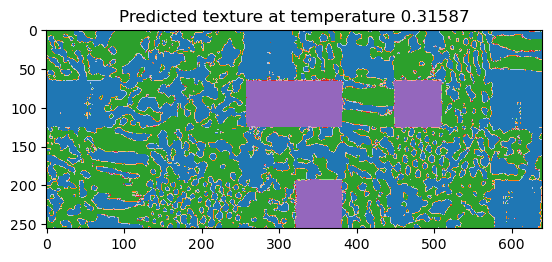

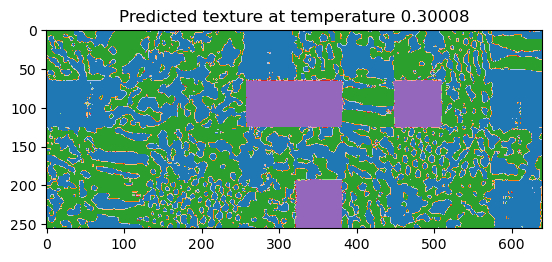

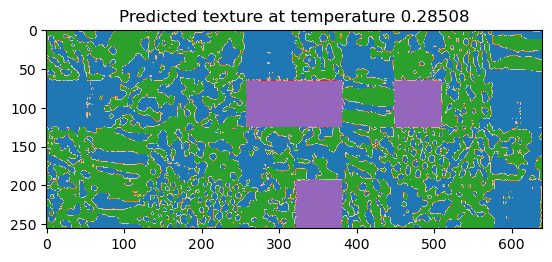

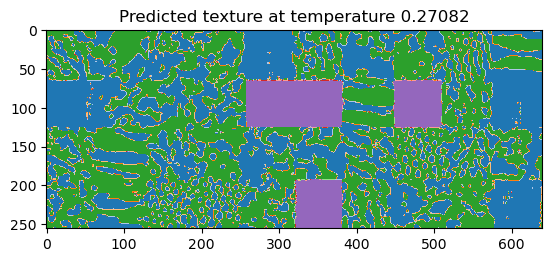

...

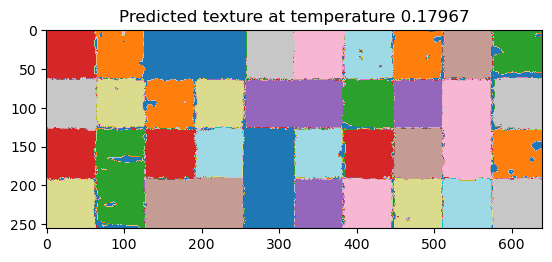

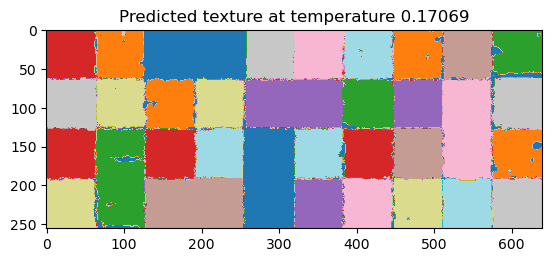

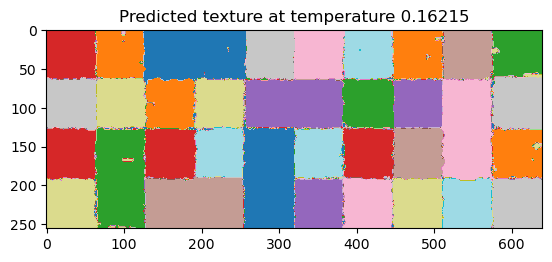

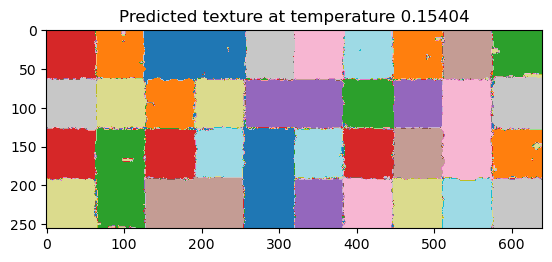

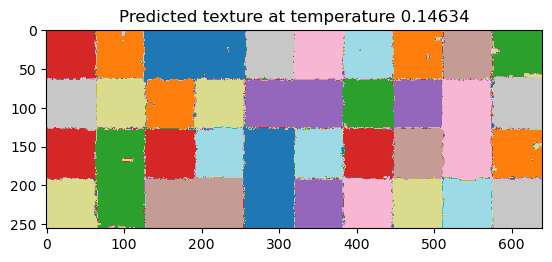

In [44]:
# Clustering at different temperatures

predicted_texture_list=HC_DA.predict(perm_texture)

for i in range(len(predicted_texture_list)):
    
    plt.figure()
    plt.imshow((predicted_texture_list[i])[0], cmap="tab20")
    plt.title("Predicted texture at temperature " +str(float(round((predicted_texture_list[i])[1], 5))))
    plt.show()



We notice that when the temperature is high, we have that the algorithm cannot recognize/separate the clusters and basically 
only two/three clusters are present (by looking at number of colors). As T decreases, more clusters appear in the label map (we can see that more colors appear and the predicted label permuted texture gets more defined, i.e. only one color is predominant in each label permuted texture). When T is low (but not too low as otherwise we would incur in the risk of overfitting (we avoid this by setting a stopping temperature)), we see that the algorithm successfully recovers all the cluster assignments.
This is consistent with the phase transition analysis of deterministic annealing that was analyzed also in the last
assignment. Indeed, there we saw that as we decrease T, at the critical temperature we observe centroids splitting. There we also noticed that having a stopping temperature T is crucial to have good performance as with very low tempeatures the model is prone to overfitting 

## Comments

We hope you found this exercise instructive.

Feel free to leave comments below, we will read them carefully.